In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import joblib
import numpy as np
from sklearn import tree
import time
import shap
import xgboost
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tabgan.sampler import OriginalGenerator, GANGenerator


In [2]:
df = pd.read_csv("Heatstroke.csv") #dataset
X = df.iloc[:,0:25]
y = df.iloc[:,26]
df.shape

(609, 27)

In [3]:
df.describe()

,Daily Ingested Water (L),Time of year (month),Cardiovascular disease history,Dehydration,Heat Index (HI),Diastolic BP,Environmental temperature (C),Sickle Cell Trait (SCT),Systolic BP,Weight (kg),...,Heart / Pulse rate (b/min),Age,Sweating,"Skin color (flushed/normal=1, pale=0.5, cyatonic=0)",Strenuous exercise,Nationality,Sex,Hot/dry skin,Time of day,Heat stroke
count,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,...,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000,609.000000
mean,3.520119,6.091975,0.047619,0.001642,84.497405,81.235813,31.277937,0.003284,114.323615,47.751283,...,120.420787,41.129276,0.441708,0.082874,0.388117,0.563218,0.515599,0.077176,12.819241,0.178982
std,1.443838,3.471044,0.213134,0.040522,16.266051,13.365608,5.706509,0.057260,15.319954,5.548351,...,27.761283,14.501809,0.496999,0.182378,0.292983,0.496395,0.500167,0.267089,2.270532,0.383652
min,1.005512,0.003924,0.000000,0.000000,31.859605,0.000000,14.133432,0.000000,0.000000,41.279030,...,41.647529,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.002272,0.000000
25%,2.335941,3.003778,0.000000,0.000000,73.005260,81.388233,27.459657,0.000000,111.899424,44.442865,...,102.851595,28.676784,0.000000,0.023166,0.111133,0.000000,0.000000,0.000000,10.928394,0.000000
50%,3.501037,6.440839,0.000000,0.000000,83.461479,84.166226,31.157351,0.000000,114.590011,47.647350,...,121.439809,40.462594,0.000000,0.049303,0.377109,1.000000,1.000000,0.000000,12.773230,0.000000
75%,4.749776,9.051857,0.000000,0.000000,98.687987,87.080987,35.509664,0.000000,117.393279,50.594373,...,136.587402,51.379236,1.000000,0.073178,0.639184,1.000000,1.000000,0.000000,14.657338,0.000000
max,10.500000,11.977820,1.000000,1.000000,122.749205,116.000000,44.271485,1.000000,219.000000,151.953000,...,210.290132,90.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,17.000000,1.000000


In [4]:
df.head()

,Daily Ingested Water (L),Time of year (month),Cardiovascular disease history,Dehydration,Heat Index (HI),Diastolic BP,Environmental temperature (C),Sickle Cell Trait (SCT),Systolic BP,Weight (kg),...,Heart / Pulse rate (b/min),Age,Sweating,"Skin color (flushed/normal=1, pale=0.5, cyatonic=0)",Strenuous exercise,Nationality,Sex,Hot/dry skin,Time of day,Heat stroke
0,2.821588,7.000000,0,0,107.296910,20.0,39.0,0,60.0,48.364079,...,166.0,38.0,0,0.021014,0.5,1,1,0,10.550628,1
1,5.000000,6.841842,0,0,105.410610,90.0,37.7,0,120.0,52.413863,...,68.0,50.0,1,0.045987,0.0,1,0,0,10.613669,1
2,5.000000,4.636197,0,0,101.823065,50.0,37.7,0,100.0,46.344503,...,96.0,64.0,0,0.031299,0.0,1,0,0,14.419615,1
3,10.500000,2.589828,0,0,95.925389,78.0,37.7,0,116.0,42.132476,...,70.0,19.0,0,0.052654,0.0,1,0,0,9.467515,1
4,5.000000,9.914389,0,0,101.673016,88.0,37.7,0,130.0,41.856694,...,88.0,21.0,1,0.076099,0.0,1,0,0,12.460315,1


In [5]:
df.isna().sum()

Daily Ingested Water (L)                               0
Time of year (month)                                   0
Cardiovascular disease history                         0
Dehydration                                            0
Heat Index (HI)                                        0
Diastolic BP                                           0
Environmental temperature (C)                          0
Sickle Cell Trait (SCT)                                0
Systolic BP                                            0
Weight (kg)                                            0
Patient temperature                                    0
Rectal temperature (deg C)                             0
Relative Humidity                                      0
Exposure to sun                                        0
BMI                                                    0
Exertional (1) vs classic (0)                          0
Barometric Pressure                                    0
Heart / Pulse rate (b/min)     

In [6]:
df.dtypes

Daily Ingested Water (L)                               float64
Time of year (month)                                   float64
Cardiovascular disease history                           int64
Dehydration                                              int64
Heat Index (HI)                                        float64
Diastolic BP                                           float64
Environmental temperature (C)                          float64
Sickle Cell Trait (SCT)                                  int64
Systolic BP                                            float64
Weight (kg)                                            float64
Patient temperature                                    float64
Rectal temperature (deg C)                             float64
Relative Humidity                                      float64
Exposure to sun                                        float64
BMI                                                    float64
Exertional (1) vs classic (0)                          

In [7]:
df.groupby('Heat stroke').size()

Heat stroke
0    500
1    109
dtype: int64

In [8]:
df.iloc[:,0:26]

,Daily Ingested Water (L),Time of year (month),Cardiovascular disease history,Dehydration,Heat Index (HI),Diastolic BP,Environmental temperature (C),Sickle Cell Trait (SCT),Systolic BP,Weight (kg),...,Barometric Pressure,Heart / Pulse rate (b/min),Age,Sweating,"Skin color (flushed/normal=1, pale=0.5, cyatonic=0)",Strenuous exercise,Nationality,Sex,Hot/dry skin,Time of day
0,2.821588,7.000000,0,0,107.296910,20.000000,39.000000,0,60.000000,48.364079,...,29.97,166.000000,38.000000,0,0.021014,0.500000,1,1,0,10.550628
1,5.000000,6.841842,0,0,105.410610,90.000000,37.700000,0,120.000000,52.413863,...,29.97,68.000000,50.000000,1,0.045987,0.000000,1,0,0,10.613669
2,5.000000,4.636197,0,0,101.823065,50.000000,37.700000,0,100.000000,46.344503,...,29.97,96.000000,64.000000,0,0.031299,0.000000,1,0,0,14.419615
3,10.500000,2.589828,0,0,95.925389,78.000000,37.700000,0,116.000000,42.132476,...,29.97,70.000000,19.000000,0,0.052654,0.000000,1,0,0,9.467515
4,5.000000,9.914389,0,0,101.673016,88.000000,37.700000,0,130.000000,41.856694,...,29.97,88.000000,21.000000,1,0.076099,0.000000,1,0,0,12.460315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604,2.625332,11.808261,0,0,69.444843,82.705255,28.276056,0,117.025213,45.173841,...,29.97,106.868166,28.952569,1,0.060595,0.038827,1,1,0,16.994422
605,1.069333,7.369952,0,0,67.273039,83.822981,26.008688,0,116.654793,53.125129,...,29.97,93.713145,52.733157,1,0.031162,0.657076,0,1,0,12.034963
606,1.085594,6.955786,0,0,53.017902,85.101995,32.863125,0,112.713272,47.898687,...,29.97,143.858902,21.496651,0,0.015298,0.260901,0,0,0,16.545827
607,5.916055,2.741906,0,0,78.665639,88.765944,22.353665,0,111.962413,52.487889,...,29.97,181.952819,26.420689,0,0.050419,0.305553,1,0,0,16.757862


In [9]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# LIME : Random Forest

In [10]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
#classifier.fit(X_train, y_train)
y_predict = classifier.fit(X_train, y_train).predict(X_test)

In [11]:
print(classification_report(y_test, y_predict))

print(confusion_matrix(y_test, y_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        97
           1       1.00      1.00      1.00        25

    accuracy                           1.00       122
   macro avg       1.00      1.00      1.00       122
weighted avg       1.00      1.00      1.00       122

[[97  0]
 [ 0 25]]


In [12]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode = 'classification'
)

In [13]:
X_test.iloc[4]

Daily Ingested Water (L)                                 2.160593
Time of year (month)                                     7.000000
Cardiovascular disease history                           0.000000
Dehydration                                              0.000000
Heat Index (HI)                                        105.213913
Diastolic BP                                            81.472514
Environmental temperature (C)                           40.000000
Sickle Cell Trait (SCT)                                  0.000000
Systolic BP                                            118.574728
Weight (kg)                                             44.168201
Patient temperature                                     42.622205
Rectal temperature (deg C)                              44.444444
Relative Humidity                                        0.493333
Exposure to sun                                          0.000000
BMI                                                     22.742361
Exertional

In [14]:
exp = interpretor.explain_instance(
    data_row = X_test.iloc[4],
    predict_fn = classifier.predict_proba
)

exp.show_in_notebook(show_table = True, show_all = False)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [15]:
exp = interpretor.explain_instance(
    data_row = X_test.iloc[10],
    predict_fn = classifier.predict_proba
)

exp.show_in_notebook(show_table = True, show_all = False)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


# LIME : Gaussian Naive Bayes

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state = 0)


classifier = GaussianNB()
y_predict = classifier.fit(X_train, y_train).predict(X_test)

joblib.dump(classifier,"heat-s.joblib")



['heat-s.joblib']

In [17]:
print(classification_report(y_test, y_predict))

print(confusion_matrix(y_test, y_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       148
           1       1.00      1.00      1.00        35

    accuracy                           1.00       183
   macro avg       1.00      1.00      1.00       183
weighted avg       1.00      1.00      1.00       183

[[148   0]
 [  0  35]]


In [18]:
predictions = classifier.predict(X_test)

score = accuracy_score(y_test, predictions)*100
score

100.0

In [19]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode = 'classification'
)

In [20]:
X_test.iloc[5]

Daily Ingested Water (L)                                 3.608075
Time of year (month)                                     4.173452
Cardiovascular disease history                           0.000000
Dehydration                                              0.000000
Heat Index (HI)                                        100.636432
Diastolic BP                                            60.000000
Environmental temperature (C)                           40.493065
Sickle Cell Trait (SCT)                                  0.000000
Systolic BP                                            100.000000
Weight (kg)                                             43.175242
Patient temperature                                     37.436610
Rectal temperature (deg C)                              42.200000
Relative Humidity                                        0.100000
Exposure to sun                                          0.000000
BMI                                                     20.519644
Exertional

In [21]:
exp = interpretor.explain_instance(
    data_row = X_test.iloc[4],
    predict_fn = classifier.predict_proba
)

exp.show_in_notebook(show_table = True, show_all = True)

X does not have valid feature names, but GaussianNB was fitted with feature names


In [22]:
exp = interpretor.explain_instance(
    data_row = X_test.iloc[10],
    predict_fn = classifier.predict_proba
)

exp.show_in_notebook(show_table = True, show_all = True)

X does not have valid feature names, but GaussianNB was fitted with feature names


# Shap

In [23]:
X_train_summary = shap.kmeans(X_train, 10)

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.


In [24]:
def print_accuracy(f):
    print("Root mean squared test error = {0}".format(np.sqrt(np.mean((f(X_test) - y_test)**2))))
    time.sleep(0.5)

In [25]:
shap.initjs()

# Shap: Linear Regression

In [26]:
from sklearn import linear_model
lin_regr = linear_model.LinearRegression()
lin_regr.fit(X_train, y_train)

print_accuracy(lin_regr.predict)

Root mean squared test error = 0.10524190399106988


In [27]:
ex = shap.KernelExplainer(lin_regr.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


  0%|          | 0/183 [00:00<?, ?it/s]

X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature na

X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature na

X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature na

X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature na

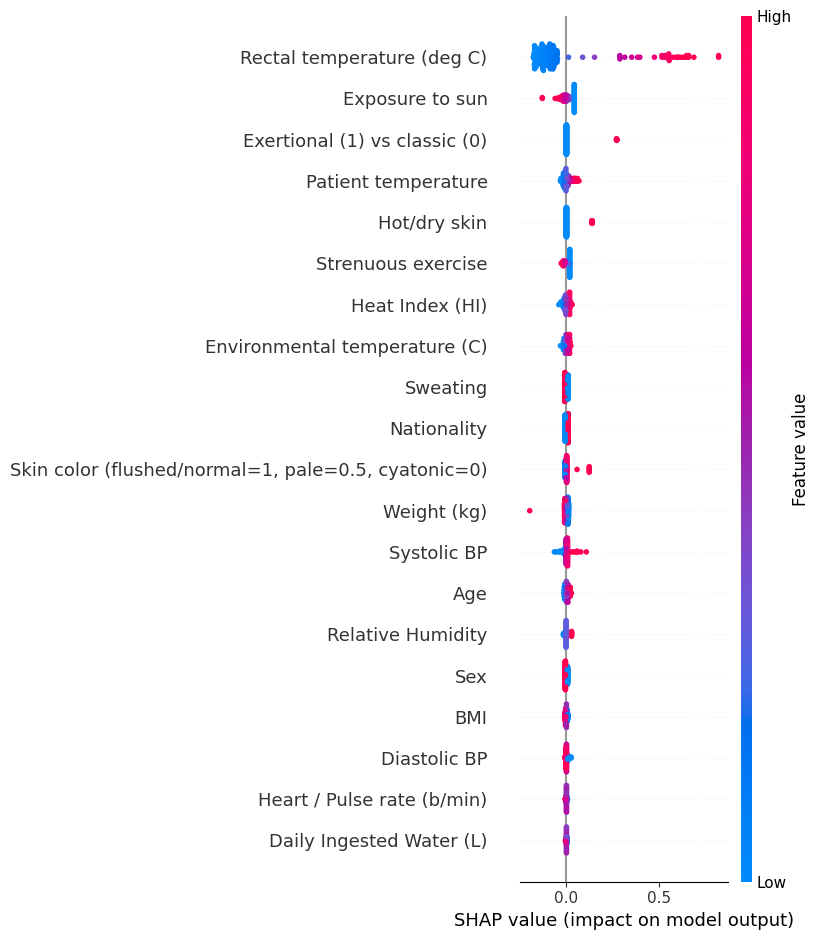

In [28]:
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

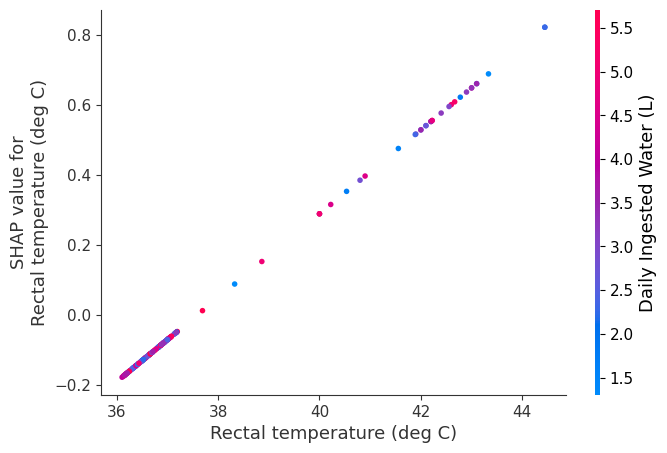

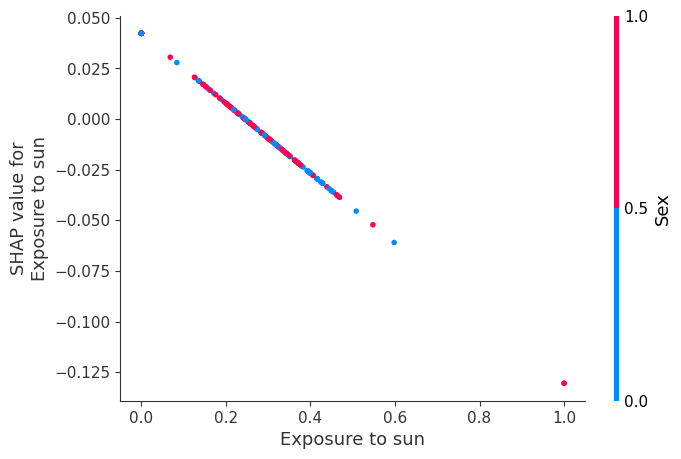

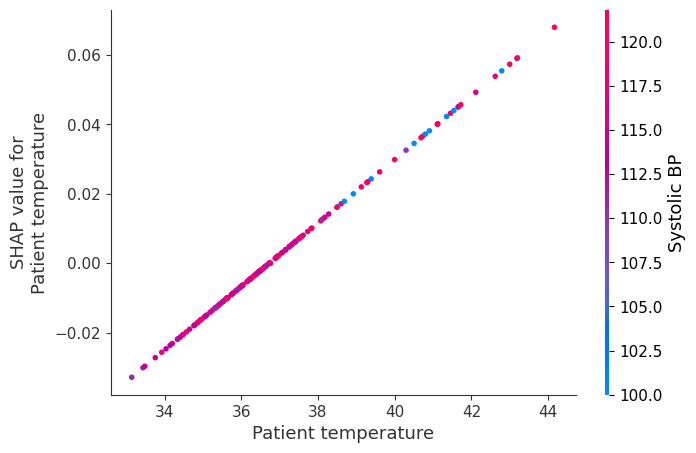

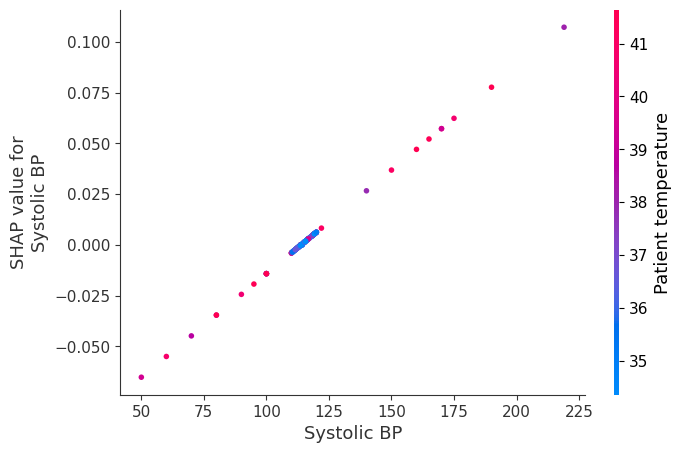

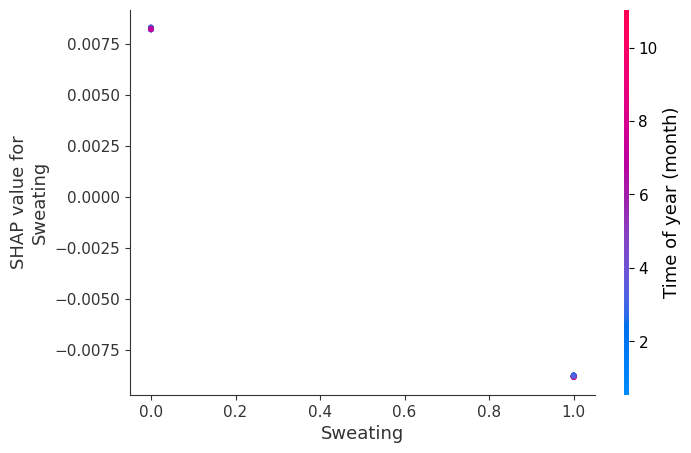

In [29]:
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)
shap.dependence_plot("Exposure to sun",shap_values, X_test)
shap.dependence_plot("Patient temperature",shap_values, X_test)
shap.dependence_plot("Systolic BP",shap_values, X_test)
shap.dependence_plot("Sweating",shap_values, X_test)

In [30]:
shap.force_plot(ex.expected_value, shap_values, X_test)

# Shap: Decision Tree


Root mean squared test error = 0.0


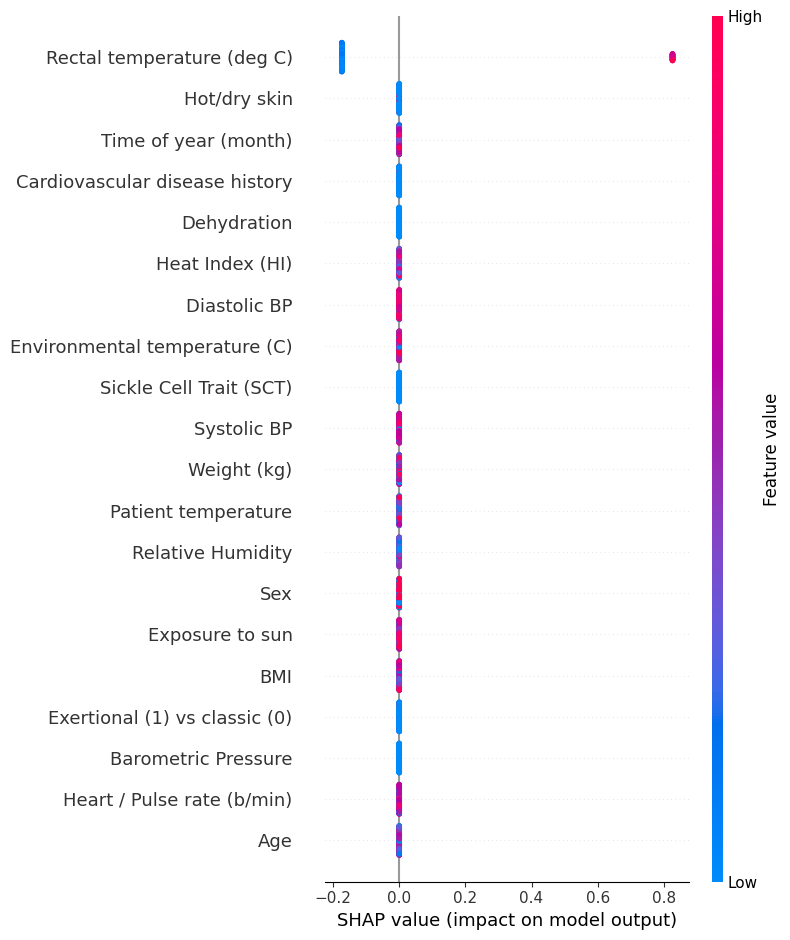

In [31]:
dtree = tree.DecisionTreeRegressor(min_samples_split=20)
dtree.fit(X_train, y_train)
y_predict=dtree.fit(X_train,y_train).predict(X_test)
print_accuracy(dtree.predict)

ex = shap.TreeExplainer(dtree)
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [32]:
print(classification_report(y_test, y_predict))

print(confusion_matrix(y_test, y_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       148
           1       1.00      1.00      1.00        35

    accuracy                           1.00       183
   macro avg       1.00      1.00      1.00       183
weighted avg       1.00      1.00      1.00       183

[[148   0]
 [  0  35]]


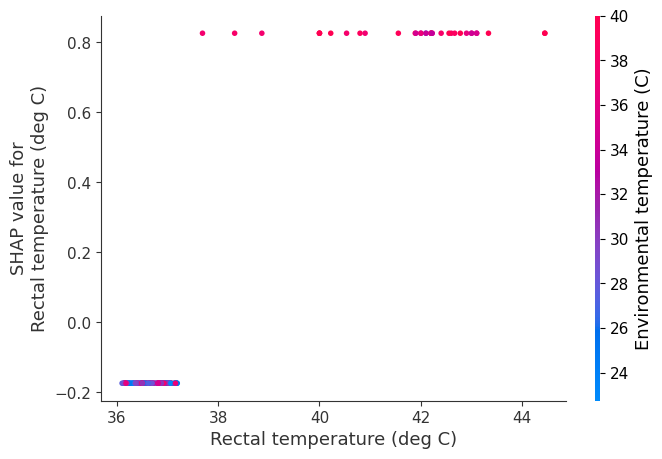

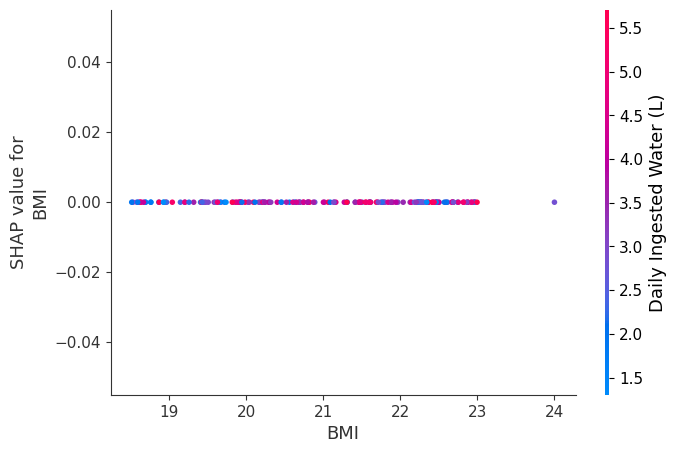

In [33]:
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)
shap.dependence_plot("BMI",shap_values, X_test)

In [34]:
shap.force_plot(ex.expected_value, shap_values, X_test)

# Shap: Random Forest

Root mean squared test error = 0.027161226784465357


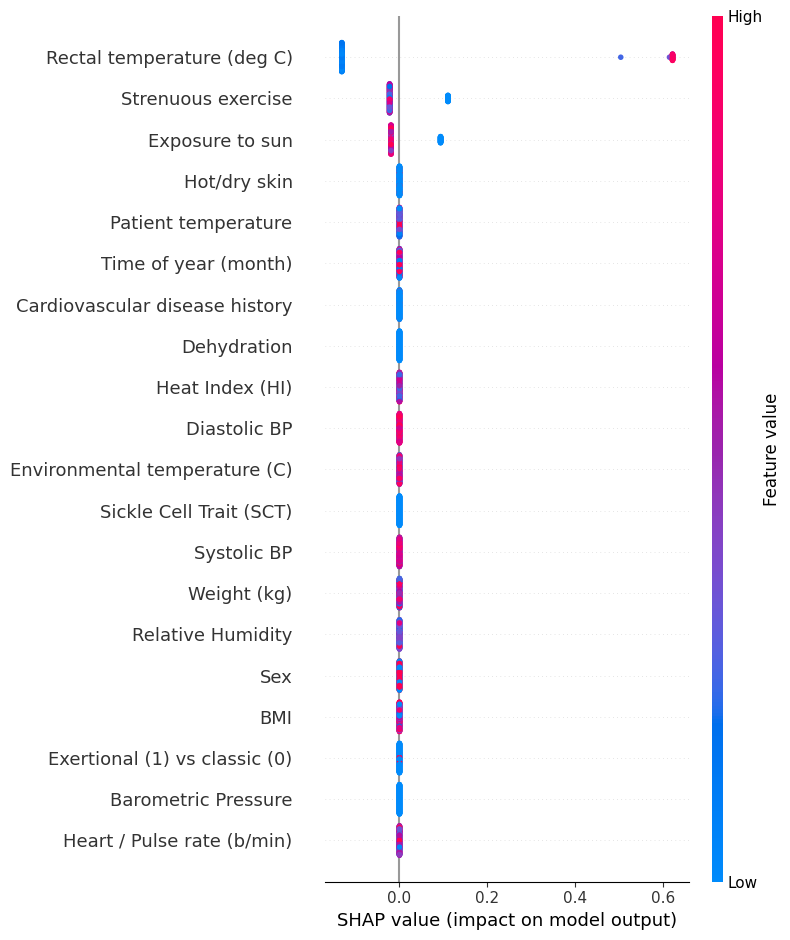

In [35]:
rforest = RandomForestRegressor(n_estimators=1000, max_depth=None, min_samples_split=2, random_state=0)
rforest.fit(X_train, y_train)
y_predict = rforest.fit(X_train, y_train).predict(X_test)
print_accuracy(rforest.predict)

explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

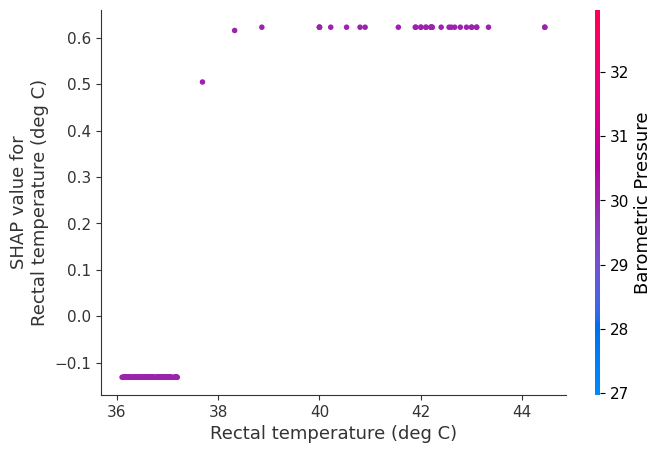

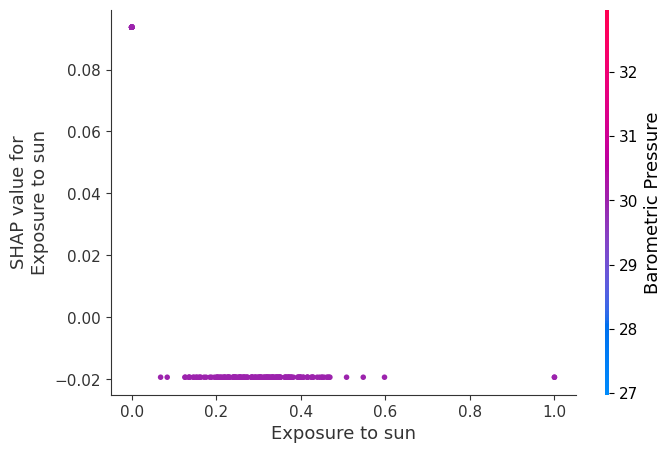

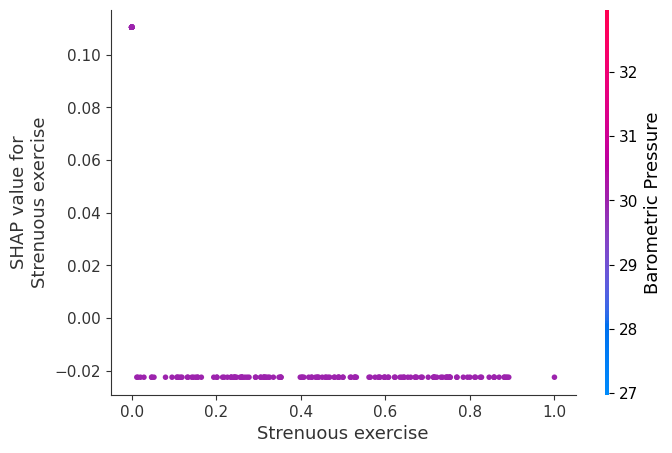

In [36]:
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)
shap.dependence_plot("Exposure to sun",shap_values, X_test)
shap.dependence_plot("Strenuous exercise",shap_values, X_test)

In [37]:
shap.force_plot(ex.expected_value, shap_values, X_test)

# Shap: Neural Network

X does not have valid feature names, but MLPRegressor was fitted with feature names


  0%|          | 0/183 [00:00<?, ?it/s]

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

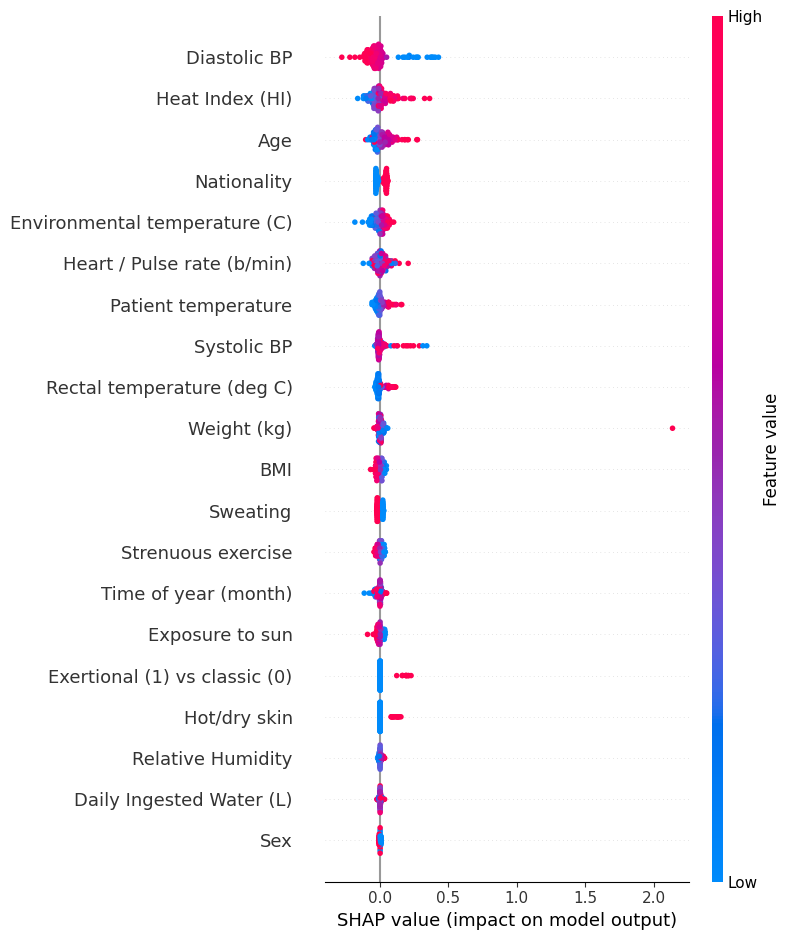

Root mean squared test error = 0.18500238192801682


In [38]:
#nn = MLPRegressor(hidden_layer_sizes=(5,2), random_state=0, solver='adam',alpha=1e-1)
nn = MLPRegressor(hidden_layer_sizes=(150,100,50),max_iter = 300,activation = 'relu',solver = 'adam')
nn.fit(X_train, y_train)
y_predict = nn.fit(X_train, y_train).predict(X_test)

explainer = shap.KernelExplainer(nn.predict, X_train_summary)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)
print_accuracy(nn.predict)

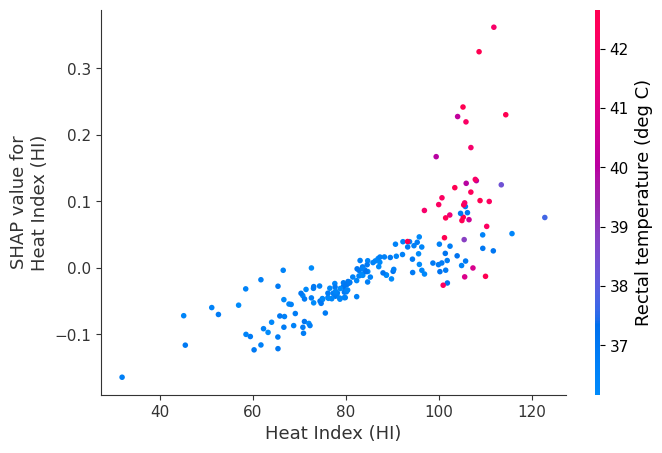

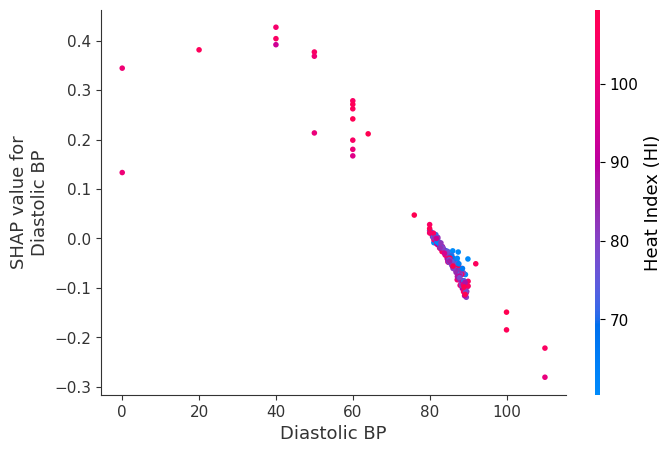

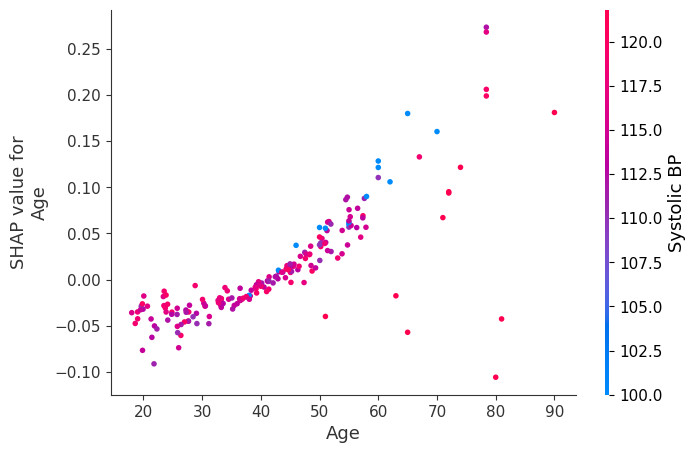

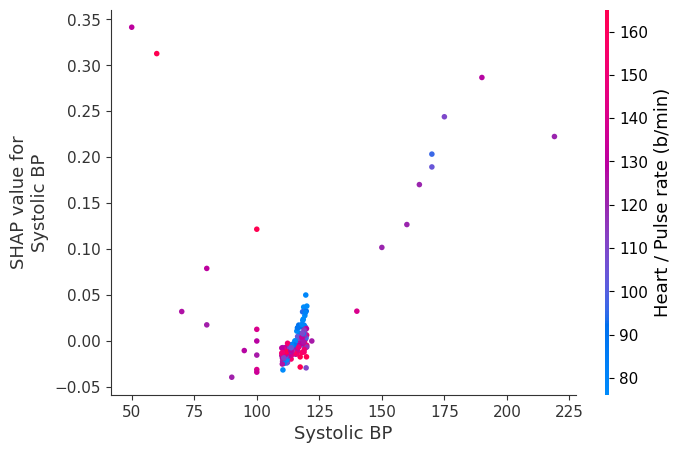

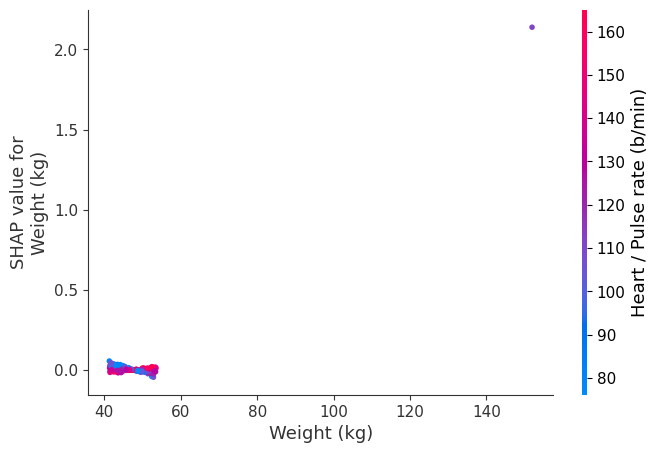

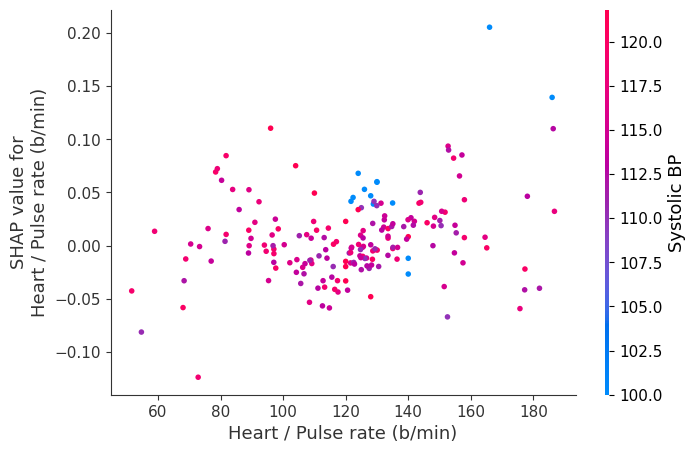

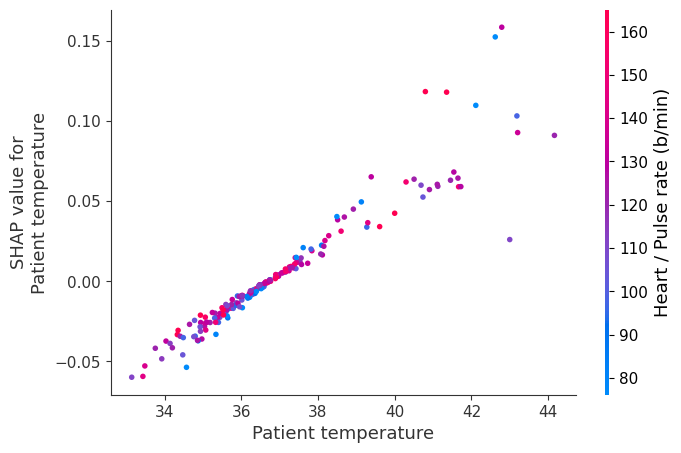

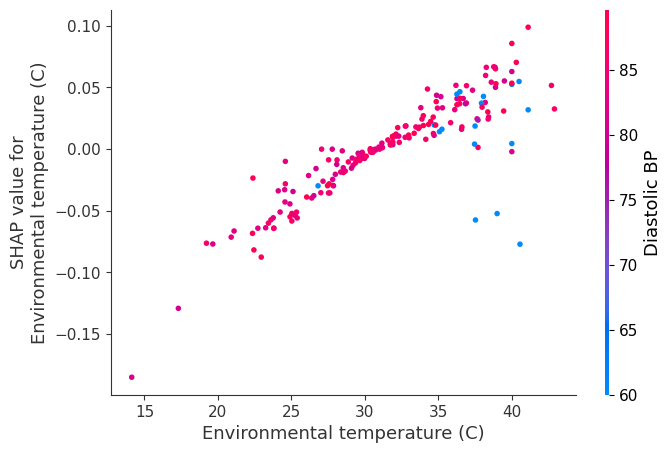

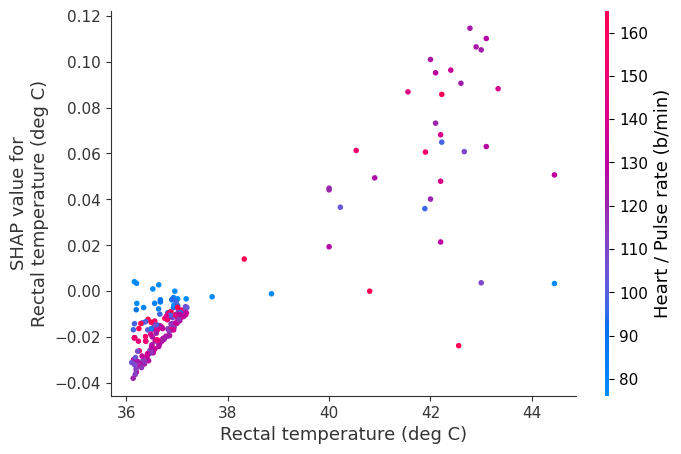

In [39]:
shap.dependence_plot("Heat Index (HI)",shap_values, X_test)
shap.dependence_plot("Diastolic BP",shap_values, X_test)
shap.dependence_plot("Age",shap_values, X_test)
shap.dependence_plot("Systolic BP",shap_values, X_test)
shap.dependence_plot("Weight (kg)",shap_values, X_test)
shap.dependence_plot("Heart / Pulse rate (b/min)",shap_values, X_test)
shap.dependence_plot("Patient temperature",shap_values, X_test)
shap.dependence_plot("Environmental temperature (C)",shap_values, X_test)
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)

In [40]:
shap.force_plot(ex.expected_value, shap_values, X_test)

# Shap: Gaussian Naive Bayes

In [41]:
XGB_model = xgboost.XGBRegressor()
XGB_model.fit(X_train, y_train)

explainer = shap.TreeExplainer(XGB_model)
shap_values = explainer.shap_values(X_test)
print_accuracy(XGB_model.predict)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Root mean squared test error = 4.0496009645843355e-05


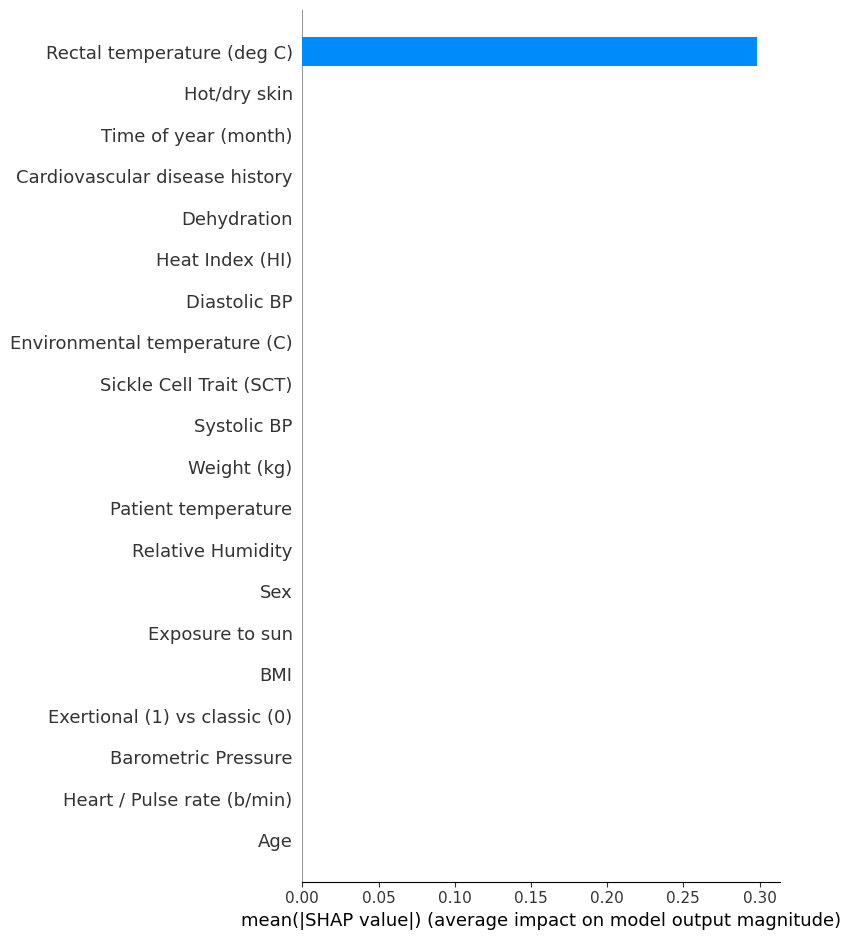

In [42]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

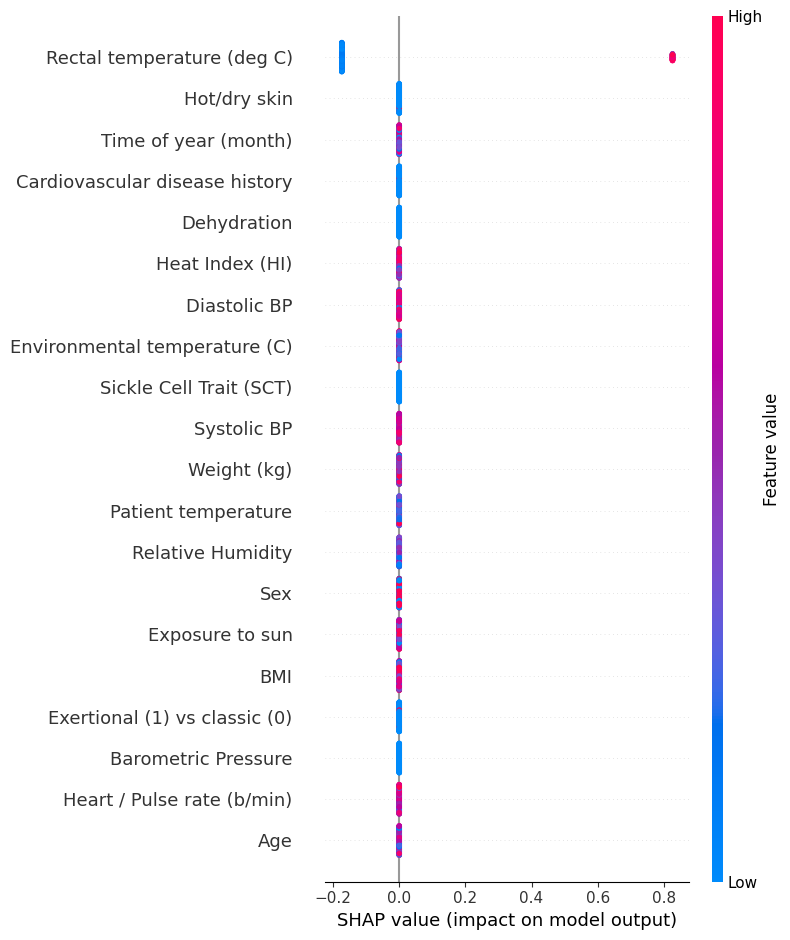

In [43]:
shap.summary_plot(shap_values, X_test, plot_type='dot')

In [44]:
shap.force_plot(explainer.expected_value, shap_values[0, :], X.iloc[0, :])

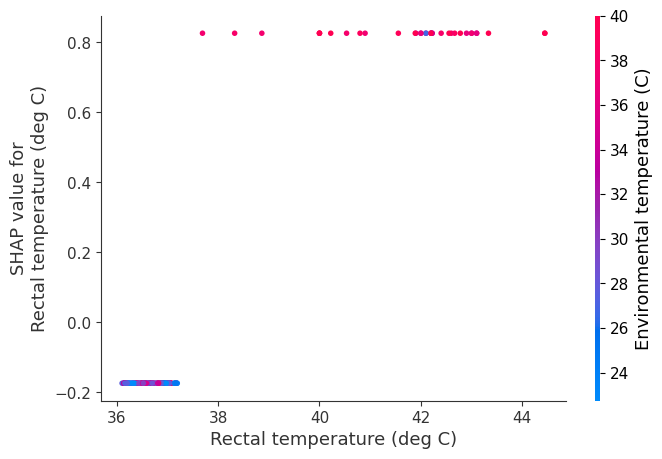

In [45]:
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)

In [46]:
shap.force_plot(explainer.expected_value, shap_values, X)

# Deep Learning Using ANN


In [47]:
df.groupby('Heat stroke').size()

Heat stroke
0    500
1    109
dtype: int64

In [48]:
50000/df.shape[0]

82.10180623973727

In [49]:
X = df.iloc[:,0:25]
y = df.iloc[:,26]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15, stratify=y)

In [50]:
y_train.value_counts()

0    400
1     87
Name: Heat stroke, dtype: int64

In [51]:
y.value_counts()

0    500
1    109
Name: Heat stroke, dtype: int64

In [52]:
500/109

4.587155963302752

In [53]:
y_test.value_counts()

0    100
1     22
Name: Heat stroke, dtype: int64

In [54]:
X_train.shape

(487, 25)

In [55]:
X_test.shape

(122, 25)

In [56]:
X_train[:10]

,Daily Ingested Water (L),Time of year (month),Cardiovascular disease history,Dehydration,Heat Index (HI),Diastolic BP,Environmental temperature (C),Sickle Cell Trait (SCT),Systolic BP,Weight (kg),...,Exertional (1) vs classic (0),Barometric Pressure,Heart / Pulse rate (b/min),Age,Sweating,"Skin color (flushed/normal=1, pale=0.5, cyatonic=0)",Strenuous exercise,Nationality,Sex,Hot/dry skin
380,3.685161,9.765972,1,0,63.243403,81.932740,31.738002,0,111.411734,52.448906,...,0,29.97,150.103804,44.976032,1,0.014593,0.398733,0,0,0
478,4.288847,3.650496,0,0,75.682708,81.360206,25.128769,0,118.764281,51.870432,...,0,29.97,69.042241,33.840605,1,0.089953,0.632604,0,1,0
329,4.871070,7.704833,0,0,98.284122,82.469855,38.970289,0,118.668742,45.097402,...,0,29.97,170.683273,36.115525,1,0.072766,0.525546,0,1,0
378,2.921043,0.791272,0,0,45.106855,87.439374,31.564280,0,112.305697,48.358041,...,0,29.97,177.221016,35.199991,0,0.002460,0.335160,1,1,0
135,1.584028,4.266391,0,0,86.060496,85.261829,33.044437,0,111.340422,44.593518,...,0,29.97,118.878358,45.933409,1,0.078590,0.893490,1,0,0
116,2.824464,6.162130,0,0,91.740669,85.258860,33.163010,0,112.478071,53.146794,...,0,29.97,99.465731,19.383118,1,0.001150,0.525545,0,1,0
534,2.221234,5.567951,0,0,96.311276,84.758210,29.360220,0,116.582920,51.514616,...,0,29.97,117.541542,43.560123,1,0.074528,0.644052,0,0,0
396,4.179162,6.583909,0,0,68.512577,88.661857,20.070460,0,115.293732,43.788733,...,0,29.97,132.817717,53.040737,1,0.064084,0.405467,0,1,0
278,2.962286,8.586580,0,0,80.769223,89.539367,27.459657,0,114.279347,49.547582,...,0,29.97,124.846061,30.288340,1,0.020334,0.242616,0,0,0
157,5.667174,3.024987,0,0,95.607758,83.863241,30.998292,0,118.748037,45.484921,...,0,29.97,68.864815,27.722353,1,0.049079,0.751522,0,0,0


In [57]:
len(X_train.columns)

25

## Build a model (ANN) in tensorflow/keras

In [58]:
from tensorflow_addons import losses

You are currently using a nightly version of TensorFlow (2.11.0-dev20220812). 
TensorFlow Addons offers no support for the nightly versions of TensorFlow. Some things might work, some other might not. 
If you encounter a bug, do not file an issue on GitHub.


In [59]:
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import confusion_matrix , classification_report

In [60]:
def ANN(X_train, y_train, X_test, y_test, loss, weights):
    model = keras.Sequential([
        keras.layers.Dense(26, input_dim=25, activation='relu'),
        keras.layers.Dense(15, activation='relu'),
        keras.layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss=loss, metrics=['accuracy'])
    
    if weights == -1:
        history = model.fit(X_train, y_train, epochs=125, batch_size=32, validation_data=(X_test, y_test))
    else:
        history = model.fit(X_train, y_train, epochs=125, class_weight = weights, batch_size=32, validation_data=(X_test, y_test))
    
    print(model.evaluate(X_test, y_test))
    
    y_preds = model.predict(X_test)
    y_preds = np.round(y_preds)
    
    # Predict
    _, acc = model.evaluate(X_test,y_test)
    print("Accuracy = ", (acc*100.0), "%")
    
    print("Classification Report: \n", classification_report(y_test, y_preds))
    print(history.history.keys())
    
    # plot trainign and validation accuracy and loss ar deach epoch
    import matplotlib.pyplot as plt
    # plot trainign and validation accuracy and loss ar deach epoch
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()
    
    #loss = history.history['loss']
    #val_loss = history.history['val_loss']
    #epochs = range(1, len(loss)+1)
    #plt.plot(epochs, loss, 'y', label="Training loss")
    #plt.plot(epochs, val_loss, 'r', label="Validation loss")
    #plt.title("training and validation loss")
    #plt.xlabel("Epochs")
    #plt.ylabel("loss")
    #plt.legend()
    #plt.show()
    
    #acc = history.history['accuracy']
    #val_loss = history.history['val_accuracy']
    #epochs = range(1, len(loss)+1)
    #plt.plot(epochs, loss, 'y', label="Training acc")
    #plt.plot(epochs, val_loss, 'r', label="Validation acc")
    #plt.title("training and validation loss")
    #plt.xlabel("Epochs")
    #plt.ylabel("Accuracy")
    #plt.legend()
    #plt.show()
    
    
    #predicting test set results
    y_pred = model.predict(X_test)
    y_pred =  (y_pred > 0.5)
    
    #confusion matrix
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot = True,fmt='g')
    
    
    return y_preds

Epoch 1/125
16/16 [==============================] - 4s 35ms/step - loss: 21.2322 - accuracy: 0.1807 - val_loss: 1.3935 - val_accuracy: 0.4754
Epoch 2/125
16/16 [==============================] - 0s 8ms/step - loss: 1.0917 - accuracy: 0.8563 - val_loss: 1.1861 - val_accuracy: 0.8361
Epoch 3/125
16/16 [==============================] - 0s 9ms/step - loss: 1.2901 - accuracy: 0.8419 - val_loss: 0.3626 - val_accuracy: 0.8934
Epoch 4/125
16/16 [==============================] - 0s 9ms/step - loss: 0.4028 - accuracy: 0.9220 - val_loss: 0.2948 - val_accuracy: 0.9180
Epoch 5/125
16/16 [==============================] - 0s 9ms/step - loss: 0.2633 - accuracy: 0.9179 - val_loss: 0.2446 - val_accuracy: 0.9508
Epoch 6/125
16/16 [==============================] - 0s 9ms/step - loss: 0.2169 - accuracy: 0.9199 - val_loss: 0.2303 - val_accuracy: 0.9754
Epoch 7/125
16/16 [==============================] - 0s 8ms/step - loss: 0.1608 - accuracy: 0.9446 - val_loss: 0.2397 - val_accuracy: 0.9754
Epoch 8/125

Epoch 59/125
16/16 [==============================] - 0s 10ms/step - loss: 0.0342 - accuracy: 0.9918 - val_loss: 0.2999 - val_accuracy: 0.9508
Epoch 60/125
16/16 [==============================] - 0s 10ms/step - loss: 0.0474 - accuracy: 0.9836 - val_loss: 0.2267 - val_accuracy: 0.9836
Epoch 61/125
16/16 [==============================] - 0s 9ms/step - loss: 0.0582 - accuracy: 0.9713 - val_loss: 0.2120 - val_accuracy: 0.9754
Epoch 62/125
16/16 [==============================] - 0s 10ms/step - loss: 0.0516 - accuracy: 0.9856 - val_loss: 0.2306 - val_accuracy: 0.9754
Epoch 63/125
16/16 [==============================] - 0s 9ms/step - loss: 0.0354 - accuracy: 0.9897 - val_loss: 0.2231 - val_accuracy: 0.9672
Epoch 64/125
16/16 [==============================] - 0s 10ms/step - loss: 0.0357 - accuracy: 0.9877 - val_loss: 0.2408 - val_accuracy: 0.9836
Epoch 65/125
16/16 [==============================] - 0s 9ms/step - loss: 0.0244 - accuracy: 0.9918 - val_loss: 0.2332 - val_accuracy: 0.9836
Ep

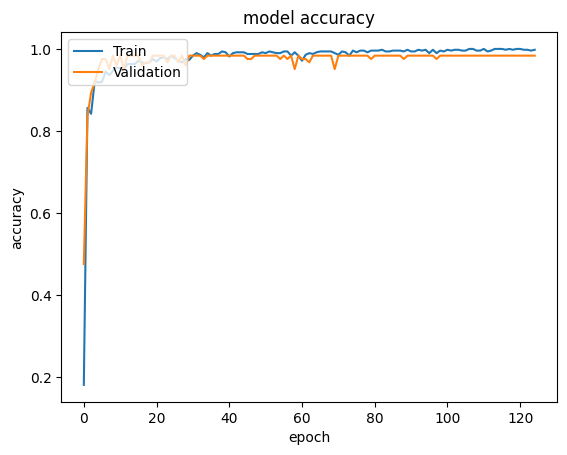

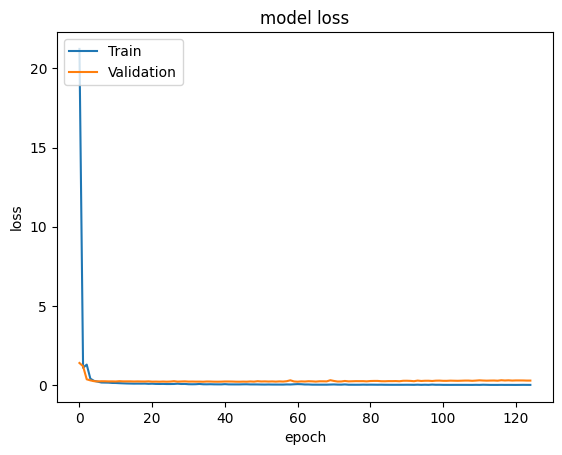

4/4 [==============================] - 0s 3ms/step


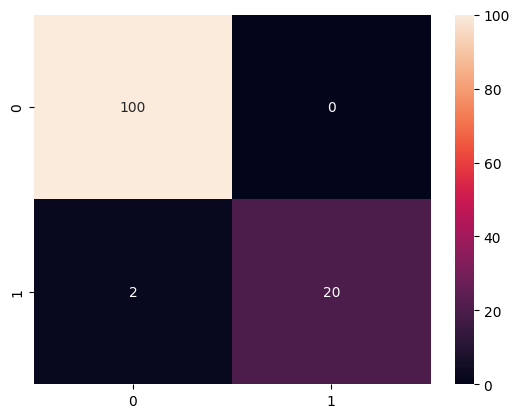

In [61]:
y_preds = ANN(X_train, y_train, X_test, y_test, 'binary_crossentropy', -1)

### SHAP: XAI on ANN

X does not have valid feature names, but MLPRegressor was fitted with feature names


  0%|          | 0/122 [00:00<?, ?it/s]

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

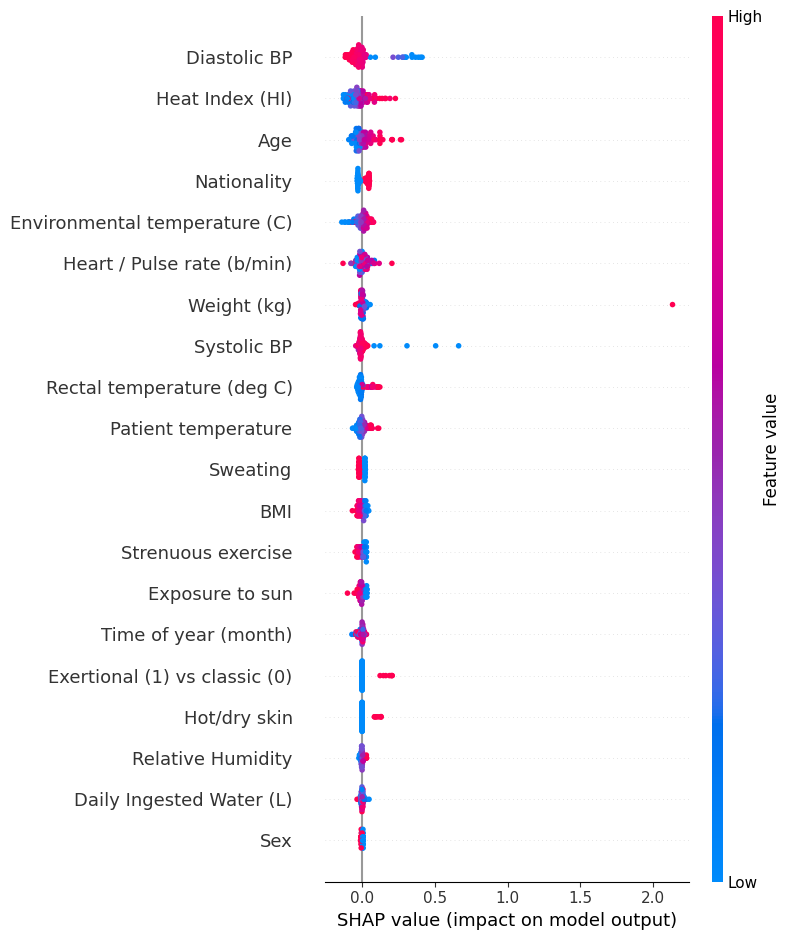

In [62]:
explainer = shap.KernelExplainer(nn.predict, X_train_summary)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

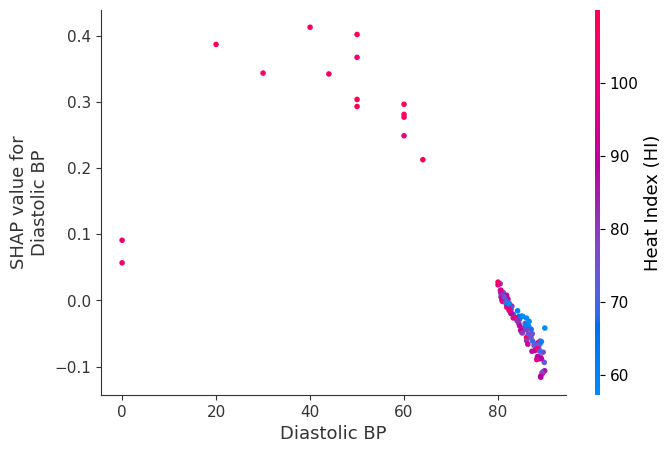

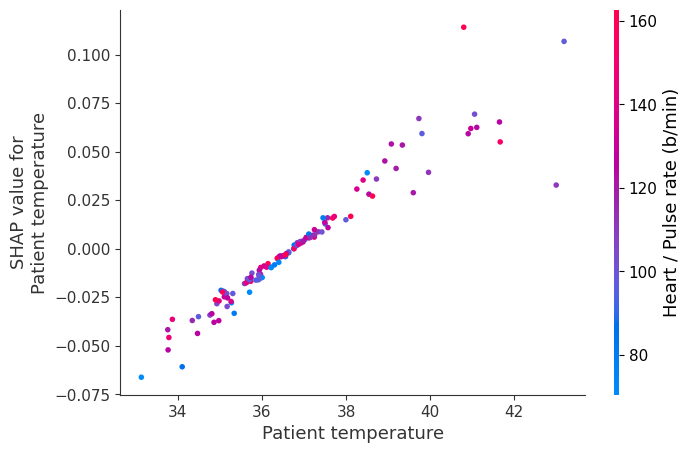

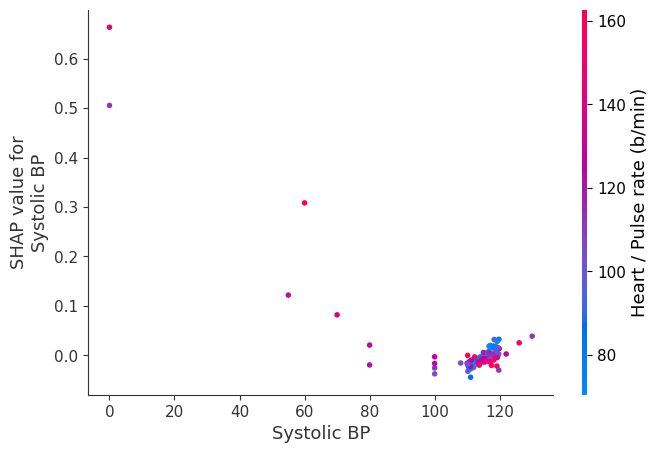

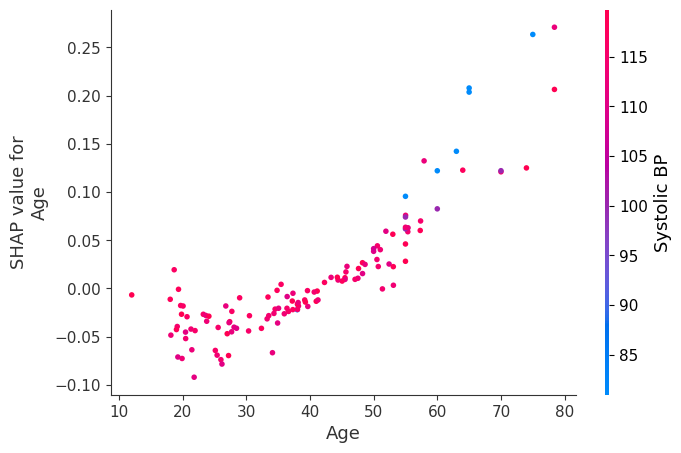

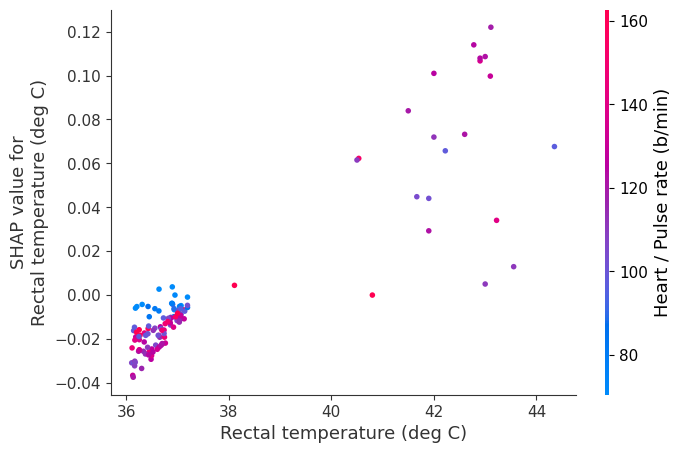

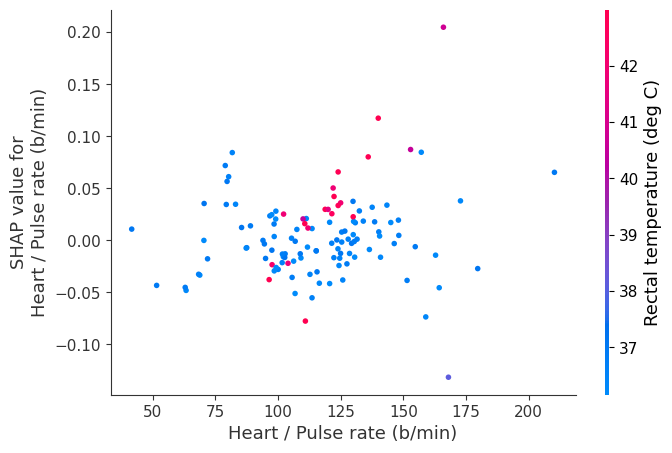

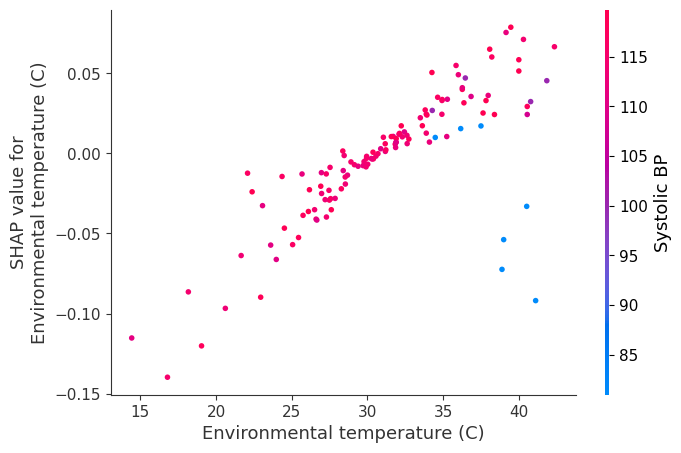

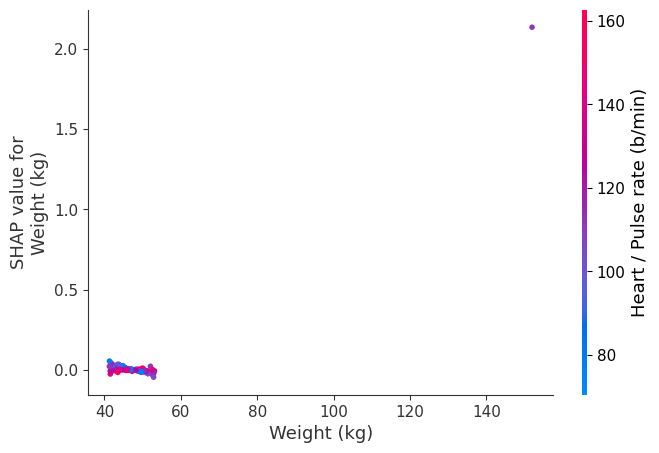

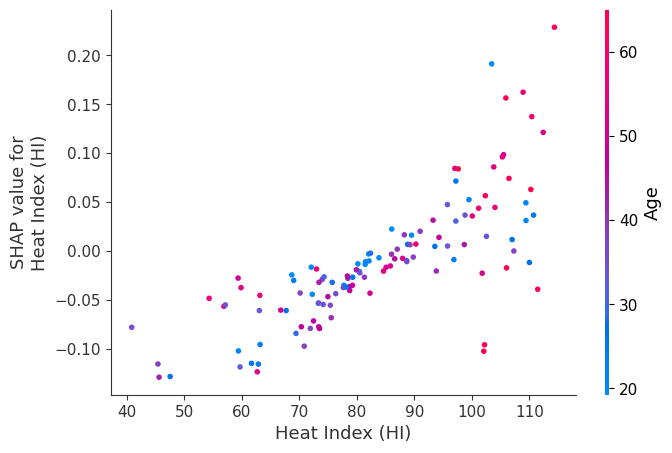

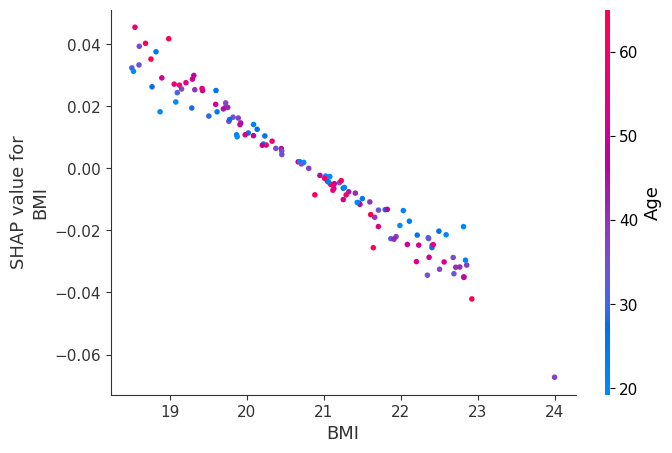

In [63]:
shap.dependence_plot("Diastolic BP",shap_values, X_test)
shap.dependence_plot("Patient temperature",shap_values, X_test)
shap.dependence_plot("Systolic BP",shap_values, X_test)
shap.dependence_plot("Age",shap_values, X_test)
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)
shap.dependence_plot("Heart / Pulse rate (b/min)",shap_values, X_test)
shap.dependence_plot("Environmental temperature (C)",shap_values, X_test)
shap.dependence_plot("Weight (kg)",shap_values, X_test)
shap.dependence_plot("Heat Index (HI)",shap_values, X_test)
shap.dependence_plot("BMI",shap_values, X_test)

In [64]:
shap.force_plot(ex.expected_value, shap_values, X_test)

### LIME: XAI on ANN

In [65]:
interpretor = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode = 'classification'
)

In [66]:
exp = interpretor.explain_instance(
    data_row = X_test.iloc[4],
    predict_fn = classifier.predict_proba
)

exp.show_in_notebook(show_table = True, show_all = True)

X does not have valid feature names, but GaussianNB was fitted with feature names


## Mitigating Skewdness of Data

### Smote

In [67]:
X = df.iloc[:,0:25]
y = df.iloc[:,26]

In [68]:
from imblearn.over_sampling import SMOTE

oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

#smote = SMOTE(sampling_strategy='minority')
#X_sm, y_sm = smote.fit_sample(X, y)

#y_sm.value_counts()
y.value_counts()

1    500
0    500
Name: Heat stroke, dtype: int64

In [69]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15, stratify=y)

In [70]:
# Number of classes in training Data
y_train.value_counts()

1    400
0    400
Name: Heat stroke, dtype: int64

In [71]:
def ANN(X_train, y_train, X_test, y_test, loss, weights):
    model = keras.Sequential([
        keras.layers.Dense(26, input_dim=25, activation='relu'),
        keras.layers.Dense(15, activation='relu'),
        keras.layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss=loss, metrics=['accuracy'])
    
    if weights == -1:
        history = model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))
    else:
        history = model.fit(X_train, y_train, epochs=150, class_weight = weights, batch_size=32, validation_data=(X_test, y_test))
    
    print(model.evaluate(X_test, y_test))
    
    y_preds = model.predict(X_test)
    y_preds = np.round(y_preds)
    
    # Predict
    _, acc = model.evaluate(X_test,y_test)
    print("Accuracy = ", (acc*100.0), "%")
    
    print("Classification Report: \n", classification_report(y_test, y_preds))
    print(history.history.keys())
    
    # plot trainign and validation accuracy and loss ar deach epoch
    import matplotlib.pyplot as plt
    # plot trainign and validation accuracy and loss ar deach epoch
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()
    #predicting test set results
    y_pred = model.predict(X_test)
    y_pred =  (y_pred > 0.5)
    
    #confusion matrix
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot = True, fmt='g')
    
    
    return y_preds

Epoch 1/150
25/25 [==============================] - 1s 19ms/step - loss: 14.6325 - accuracy: 0.5025 - val_loss: 3.1947 - val_accuracy: 0.4000
Epoch 2/150
25/25 [==============================] - 0s 7ms/step - loss: 1.4668 - accuracy: 0.5238 - val_loss: 0.5920 - val_accuracy: 0.7800
Epoch 3/150
25/25 [==============================] - 0s 8ms/step - loss: 0.3815 - accuracy: 0.8338 - val_loss: 0.2387 - val_accuracy: 0.9300
Epoch 4/150
25/25 [==============================] - 0s 8ms/step - loss: 0.2105 - accuracy: 0.9350 - val_loss: 0.1745 - val_accuracy: 0.9300
Epoch 5/150
25/25 [==============================] - 0s 6ms/step - loss: 0.1674 - accuracy: 0.9513 - val_loss: 0.1538 - val_accuracy: 0.9300
Epoch 6/150
25/25 [==============================] - 0s 7ms/step - loss: 0.1455 - accuracy: 0.9550 - val_loss: 0.1425 - val_accuracy: 0.9350
Epoch 7/150
25/25 [==============================] - 0s 7ms/step - loss: 0.1306 - accuracy: 0.9638 - val_loss: 0.1381 - val_accuracy: 0.9350
Epoch 8/150

Epoch 59/150
25/25 [==============================] - 0s 7ms/step - loss: 0.0288 - accuracy: 0.9925 - val_loss: 0.0355 - val_accuracy: 0.9900
Epoch 60/150
25/25 [==============================] - 0s 8ms/step - loss: 0.0298 - accuracy: 0.9925 - val_loss: 0.0364 - val_accuracy: 0.9900
Epoch 61/150
25/25 [==============================] - 0s 8ms/step - loss: 0.0332 - accuracy: 0.9862 - val_loss: 0.0525 - val_accuracy: 0.9800
Epoch 62/150
25/25 [==============================] - 0s 8ms/step - loss: 0.0275 - accuracy: 0.9950 - val_loss: 0.0320 - val_accuracy: 0.9750
Epoch 63/150
25/25 [==============================] - 0s 8ms/step - loss: 0.0247 - accuracy: 0.9950 - val_loss: 0.0347 - val_accuracy: 0.9800
Epoch 64/150
25/25 [==============================] - 0s 8ms/step - loss: 0.0235 - accuracy: 0.9950 - val_loss: 0.0343 - val_accuracy: 0.9800
Epoch 65/150
25/25 [==============================] - 0s 8ms/step - loss: 0.0248 - accuracy: 0.9937 - val_loss: 0.0336 - val_accuracy: 0.9800
Epoch 

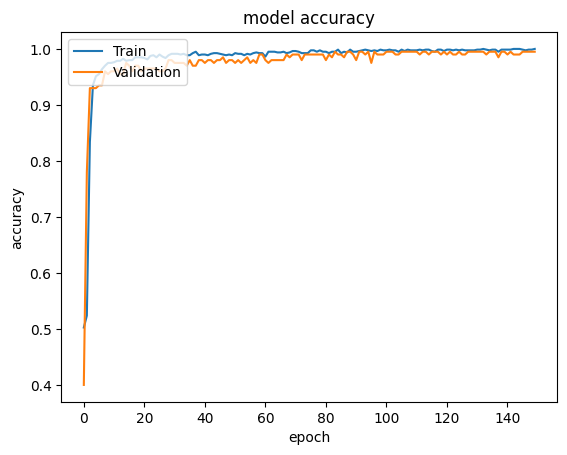

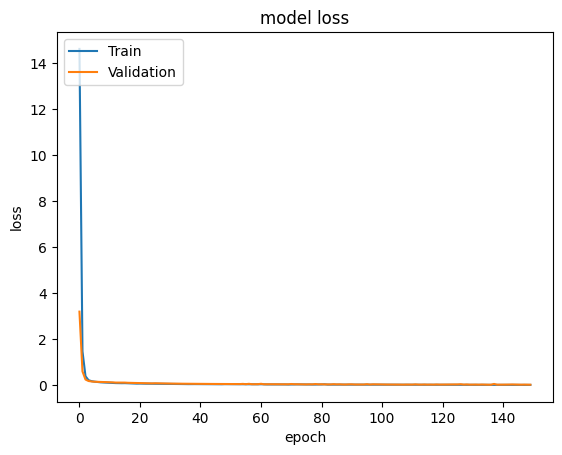

7/7 [==============================] - 0s 4ms/step


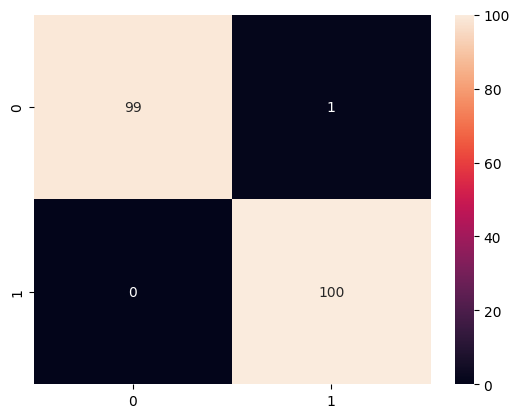

In [72]:
y_preds = ANN(X_train, y_train, X_test, y_test, 'binary_crossentropy', -1)

### Shap and LIME: SMOTE oversampling

X does not have valid feature names, but MLPRegressor was fitted with feature names


  0%|          | 0/200 [00:00<?, ?it/s]

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with featur

X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names
X does not have valid feature names, but MLPRegressor was fitted with feature names


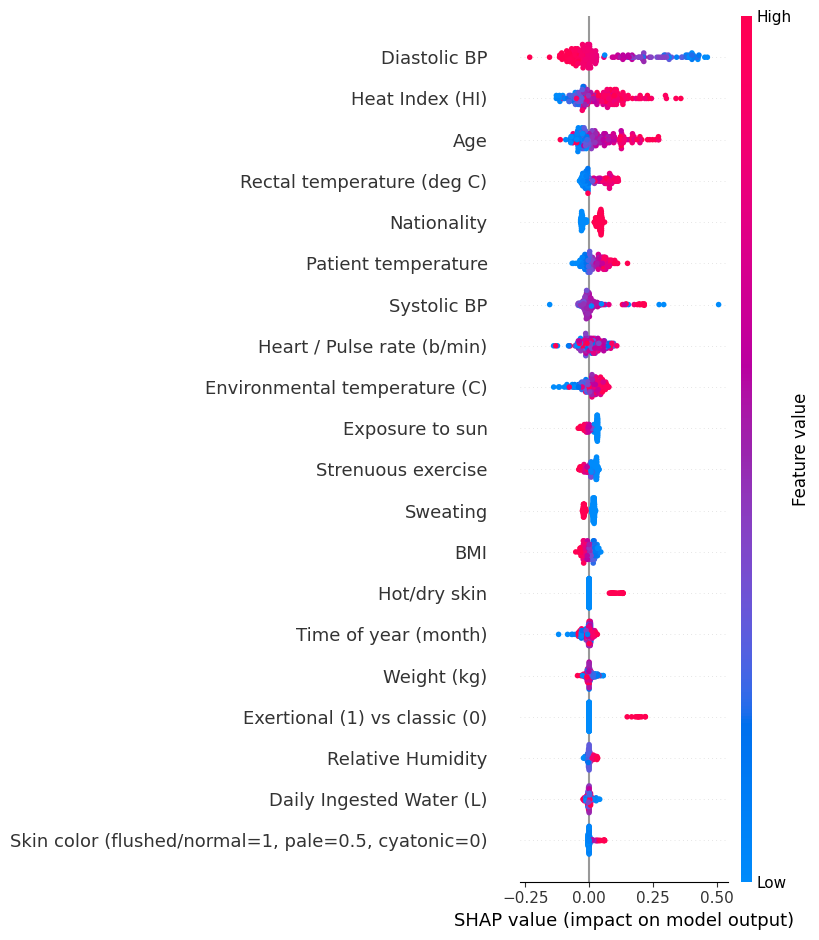

In [73]:
explainer = shap.KernelExplainer(nn.predict, X_train_summary)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

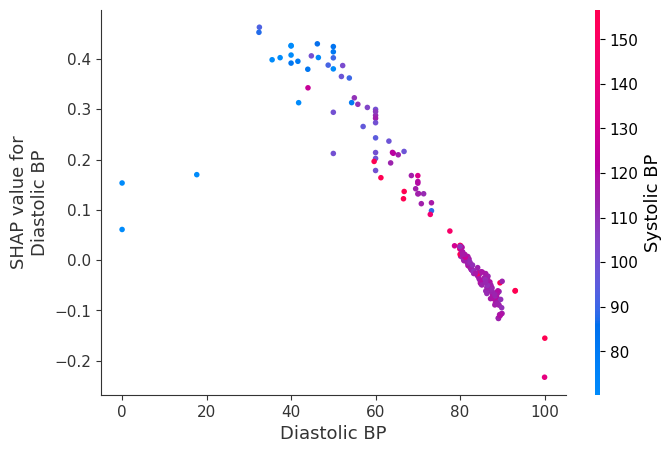

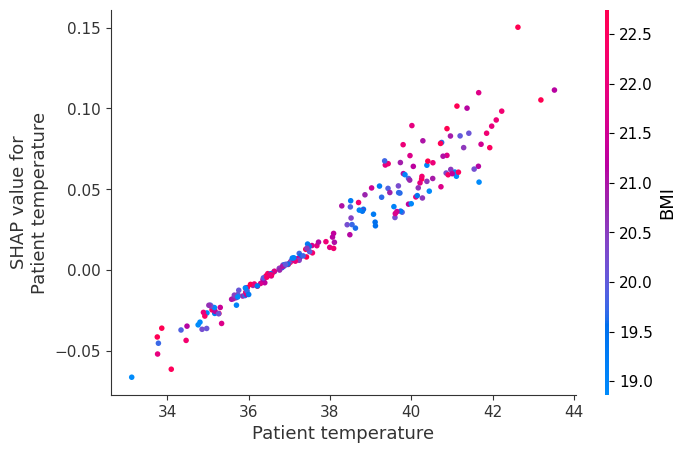

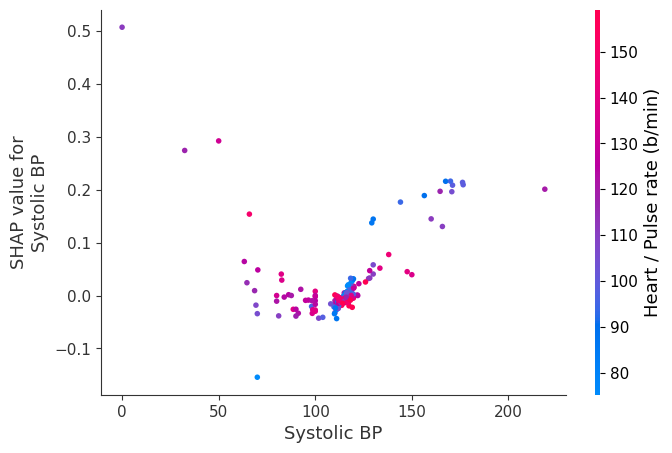

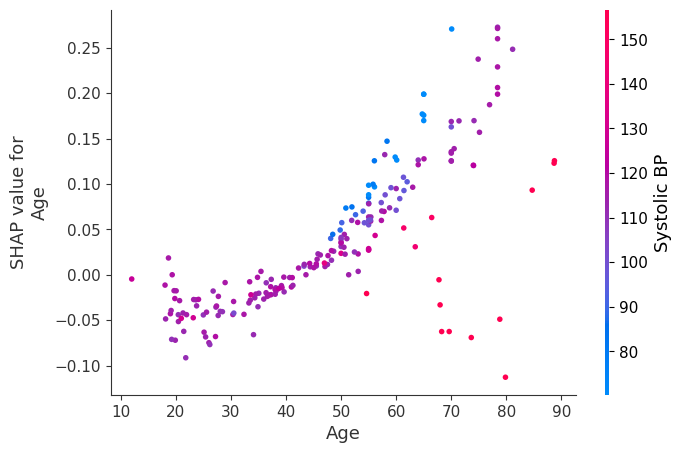

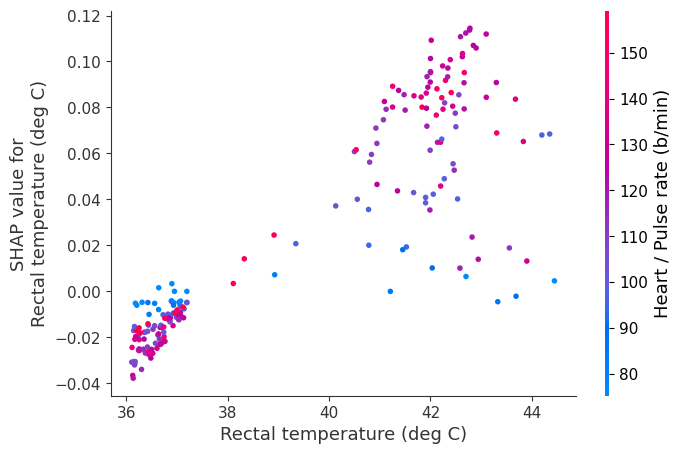

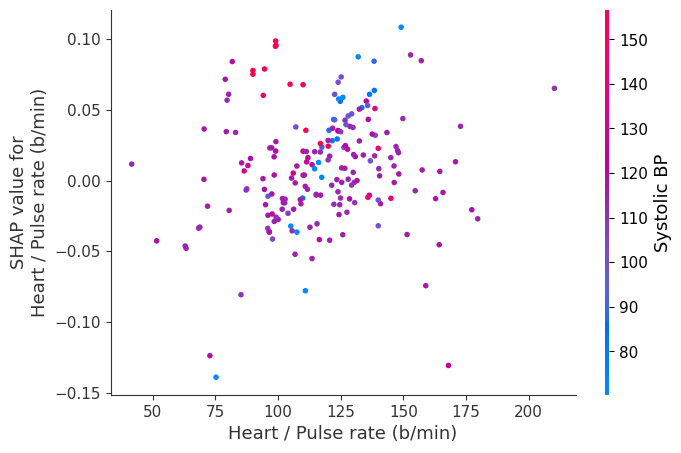

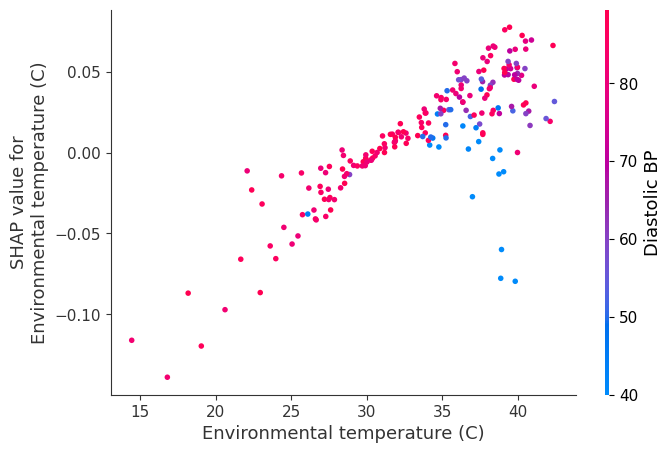

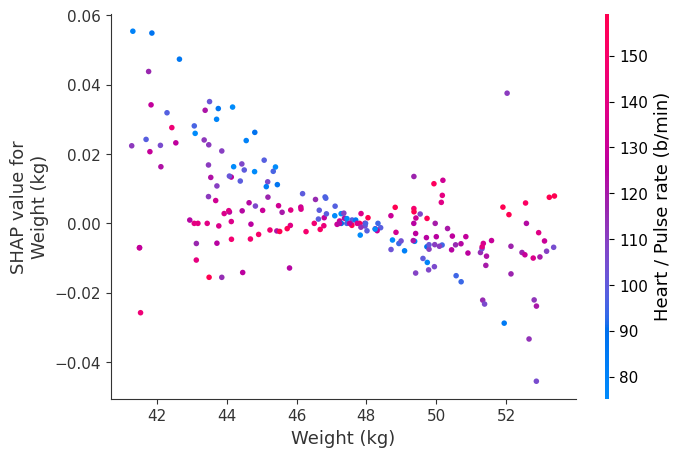

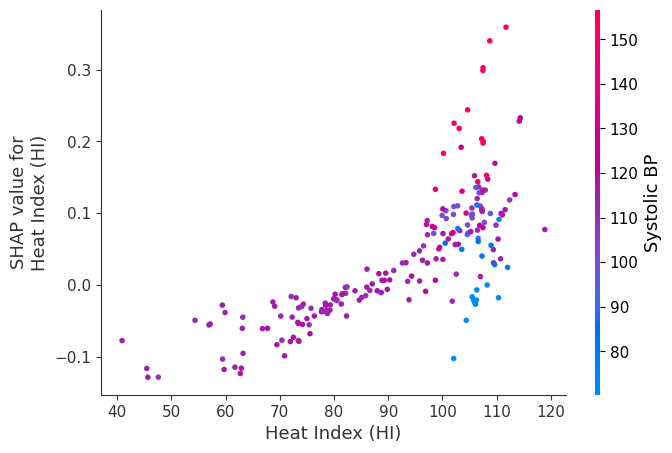

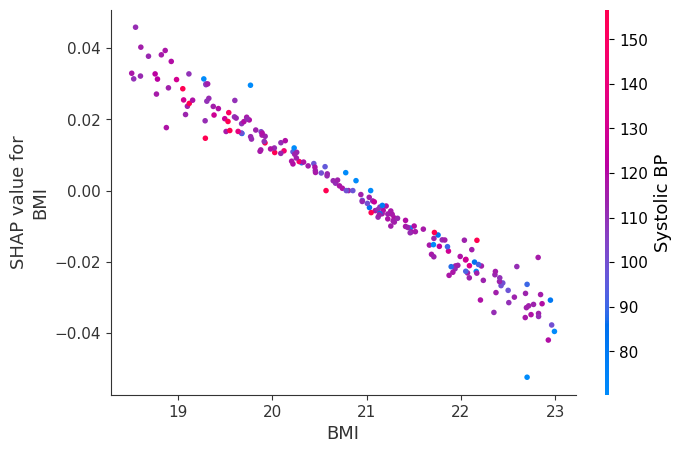

In [74]:
shap.dependence_plot("Diastolic BP",shap_values, X_test)
shap.dependence_plot("Patient temperature",shap_values, X_test)
shap.dependence_plot("Systolic BP",shap_values, X_test)
shap.dependence_plot("Age",shap_values, X_test)
shap.dependence_plot("Rectal temperature (deg C)",shap_values, X_test)
shap.dependence_plot("Heart / Pulse rate (b/min)",shap_values, X_test)
shap.dependence_plot("Environmental temperature (C)",shap_values, X_test)
shap.dependence_plot("Weight (kg)",shap_values, X_test)
shap.dependence_plot("Heat Index (HI)",shap_values, X_test)
shap.dependence_plot("BMI",shap_values, X_test)

In [75]:
shap.force_plot(ex.expected_value, shap_values, X_test)

In [76]:
interpretor = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode = 'classification'
)

In [77]:
exp = interpretor.explain_instance(
    data_row = X_test.iloc[4],
    predict_fn = classifier.predict_proba
)

exp.show_in_notebook(show_table = True, show_all = True)

X does not have valid feature names, but GaussianNB was fitted with feature names


SHAP: Red indicates class 1 and Blue indicates class 0

class 1 = Heat Stroke
class 0 = Not Heat Stroke

LIME: Orange indicates class 1 and Blue indicates class 0